<a href="https://colab.research.google.com/github/YusrilHasanuddin/BATIK-WGAN-WGAN-GP/blob/main/WGAN_GP.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [1]:
!git clone https://github.com/YusrilHasanuddin/BatikGAN.git

Cloning into 'BatikGAN'...
remote: Enumerating objects: 517, done.
remote: Counting objects: 100% (517/517), done.
remote: Compressing objects: 100% (505/505), done.
remote: Total 517 (delta 15), reused 505 (delta 8), pack-reused 0
Receiving objects: 100% (517/517), 45.12 MiB | 35.30 MiB/s, done.
Resolving deltas: 100% (15/15), done.


In [2]:
!mkdir data
!mv BatikGAN/dataset_batik/Patch/* data
!ls data

 0051-cl_A.jpg
 0051-cl_B.jpg
 0167-sample-solo-jateng-btk-s76-L410b_A.jpg
 0167-sample-solo-jateng-btk-s76-L410b_B.jpg
 0175-cl_A.jpg
 0175-cl_B.jpg
 0179-cl_A.jpg
 0179-cl_B.jpg
 06-nitik-randu-seling_A.jpg
 06-nitik-randu-seling_B.jpg
'10agt 147_A.jpg'
'10agt 147_B.jpg'
 bar-101-batik-yogya-tulis-rakitan-kawung-benggol-ceplok-nogo_A.jpg
 bar-101-batik-yogya-tulis-rakitan-kawung-benggol-ceplok-nogo_B.jpg
 batik-cap-motif-nitik_A.jpg
 batik-cap-motif-nitik_B.jpg
 batik_Grompol_motif_w_A.jpg
 batik_Grompol_motif_w_B.jpg
 Batik-Nitik-Brendi_A.jpg
 Batik-Nitik-Brendi_B.jpg
 batik-tulis-nitik-3_A.jpg
 batik-tulis-nitik-3_B.jpg
 bbr-004-batik-yogya-kombinasi-rakitan-putri-solo_A.jpg
 bbr-004-batik-yogya-kombinasi-rakitan-putri-solo_B.jpg
 ceplok-bintang_A.jpg
 ceplok-bintang_B.jpg
 ceplok-bligon1_A.jpg
 ceplok-bligon1_B.jpg
 ceplok-ganggong_A.jpg
 ceplok-ganggong_B.jpg
 Kawung-Putih-coklat1_A.jpg
 Kawung-Putih-coklat1_B.jpg
'[K]CeplokNitik-S[T]_A.jpg'
'[K]CeplokNitik-S[T]_B.jpg'
 kotak-kaw

In [3]:
path = "data/"


import tensorflow as tf

from tensorflow import keras
from tensorflow.keras.models import Sequential
from tensorflow.keras import layers
from tensorflow.keras.models import Model
from tensorflow.keras.optimizers import Adam

from matplotlib import pyplot as plt
import numpy as np

import os

In [4]:
train_images = tf.keras.utils.image_dataset_from_directory(
    path, label_mode=None, image_size=(64, 64), batch_size=64 # update from 32
)

Found 326 files belonging to 1 classes.


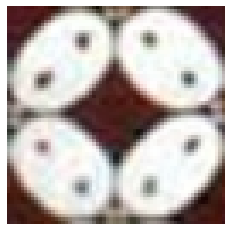

In [ ]:
image_batch = next(iter(train_images))
random_index = np.random.choice(image_batch.shape[0])
random_image = image_batch[random_index].numpy().astype("int32")

# Visualize 1 random image from the training dataset
plt.axis("off")
plt.imshow(random_image)
plt.show()

In [ ]:
def show(images):
    plt.figure(figsize=(4, 4))

    for i in range(16):
        plt.subplot(4, 4, i+1)
        img = keras.utils.array_to_img(images[i]) 
        plt.imshow(img)
        plt.axis('off') 
    plt.show()

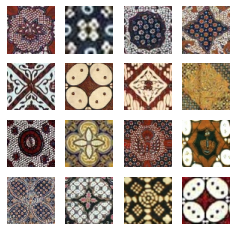

In [ ]:
# Visualize 16 images from the training dataset
show(image_batch[:16])

In [ ]:
# Normalize the images to [-1, 1] which is the range of the tanh activation
train_images = train_images.map(lambda x: (x - 127.5) / 127.5)

In [ ]:
# latent dimension of the random noise
LATENT_DIM = 64 
# weight initializer for G per DCGAN paper 
WEIGHT_INIT = tf.keras.initializers.RandomNormal(mean=0.0, stddev=0.02) 
# number of channels, 1 for gray scale and 3 for color images
CHANNELS = 3  

In [ ]:
def build_generator():
    # create a Keras Sequential model 
    model = Sequential(name="generator")

    # prepare for reshape: FC => BN => RN layers, note: input shape defined in the 1st Dense layer  
    model.add(layers.Dense(8 * 8 * 512, input_dim=LATENT_DIM))
    # model.add(layers.BatchNormalization()) 
    model.add(layers.ReLU())
    # layers.LeakyReLU(alpha=0.2),

    # 1D => 3D: reshape the output of the previous layer 
    model.add(layers.Reshape((8, 8, 512)))

    # upsample to 16x16: apply a transposed CONV => BN => RELU
    model.add(layers.Conv2DTranspose(256, (4, 4), 
                                     strides=(2, 2), 
                                     padding="same", 
                                     use_bias=False, 
                                     kernel_initializer=WEIGHT_INIT))
    model.add(layers.BatchNormalization()) # Margaret exp: add back bach norm
    model.add((layers.ReLU()))

    # upsample to 32x32: apply a transposed CONV => BN => RELU
    model.add(layers.Conv2DTranspose(128, (4, 4), 
                                     strides=(2, 2), 
                                     padding="same", 
                                     use_bias=False, 
                                     kernel_initializer=WEIGHT_INIT))
    model.add(layers.BatchNormalization()) # Margaret exp: add back bach norm
    model.add((layers.ReLU()))

    # upsample to 64x64: apply a transposed CONV => BN => RELU
    model.add(layers.Conv2DTranspose(64, (4, 4), 
                                     strides=(2, 2), 
                                     padding="same", 
                                     use_bias=False, 
                                     kernel_initializer=WEIGHT_INIT))
    model.add(layers.BatchNormalization()) # Margaret exp: add back bach norm
    model.add((layers.ReLU()))
    

    # final layer: Conv2D with tanh activation
    model.add(layers.Conv2D(CHANNELS, (4, 4), padding="same", activation="tanh"))

    # return the generator model
    return model

In [ ]:
# build the generator model
generator = build_generator() 

In [ ]:
generator.summary()

Model: "generator"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_6 (Dense)             (None, 32768)             2129920   
                                                                 
 re_lu_12 (ReLU)             (None, 32768)             0         
                                                                 
 reshape_3 (Reshape)         (None, 8, 8, 512)         0         
                                                                 
 conv2d_transpose_9 (Conv2DT  (None, 16, 16, 256)      2097152   
 ranspose)                                                       
                                                                 
 batch_normalization_9 (Batc  (None, 16, 16, 256)      1024      
 hNormalization)                                                 
                                                                 
 re_lu_13 (ReLU)             (None, 16, 16, 256)       0 

In [ ]:
# UPDATE for WGAN: a new class implementing weight clipping constraint
#class WeightClipping(tf.keras.constraints.Constraint):
#    def __init__(self, clip_value):
#        self.clip_value = clip_value
#    
#    def __call__(self, weights):
#        return tf.clip_by_value(weights, -self.clip_value, self.clip_value)
#    
#    def get_config(self):
#       return {'clip_value': self.clip_value}

In [ ]:
def build_critic(height, width, depth, alpha=0.2):
    # Weight clipping to [-1, 1] to enfoce 1-Lipschitz constraint
    # constraint = WeightClip(0.01) # UPDATE for WGAN-GP: remove weight clipping

    # create a Keras Sequential model
    model = Sequential(name="critic")
    input_shape = (height, width, depth)

    # 1. first set of CONV => BN => leaky ReLU layers
    model.add(layers.Conv2D(64, (4, 4), 
                            padding="same", 
                            strides=(2, 2), 
                            # kernel_constraint = constraint, # UPDATE for WGAN-GP: remove weight clipping
                            input_shape=input_shape))
    # model.add(layers.BatchNormalization()) # UPDATE for WGAN-GP: remove batchnorm
    model.add(layers.LeakyReLU(alpha=alpha))

    # 2. second set of CONV => BN => leacy ReLU layers
    model.add(layers.Conv2D(128, (4, 4), 
                            padding="same", 
                            strides=(2, 2))) 
                            # kernel_constraint = constraint,)) # UPDATE for WGAN-GP: remove weight clipping
    # model.add(layers.BatchNormalization()) # UPDATE for WGAN-GP: remove batchnorm
    model.add(layers.LeakyReLU(alpha=alpha))

    # 3. third set of CONV => BN => leacy ReLU layers
    model.add(layers.Conv2D(128, (4, 4), 
                            padding="same", 
                            strides=(2, 2))) 
                            # kernel_constraint = constraint,)) # UPDATE for WGAN-GP: remove weight clipping
    # model.add(layers.BatchNormalization()) # UPDATE for WGAN-GP: remove batchnorm
    model.add(layers.LeakyReLU(alpha=alpha))

    # flatten and apply dropout
    model.add(layers.Flatten())
    model.add(layers.Dropout(0.3)) 

    # linear activation in the last layer 
    # Note: Keras `Dense` layer by default is already a `linear` activation
    model.add(layers.Dense(1, activation="linear"))

    # return the critic model
    return model

In [ ]:
# build the critic model
critic = build_critic(64, 64, 3) 

In [ ]:
critic.summary()

Model: "critic"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_13 (Conv2D)          (None, 32, 32, 64)        3136      
                                                                 
 leaky_re_lu_9 (LeakyReLU)   (None, 32, 32, 64)        0         
                                                                 
 conv2d_14 (Conv2D)          (None, 16, 16, 128)       131200    
                                                                 
 leaky_re_lu_10 (LeakyReLU)  (None, 16, 16, 128)       0         
                                                                 
 conv2d_15 (Conv2D)          (None, 8, 8, 128)         262272    
                                                                 
 leaky_re_lu_11 (LeakyReLU)  (None, 8, 8, 128)         0         
                                                                 
 flatten_3 (Flatten)         (None, 8192)              0    

In [ ]:
class WGAN_GP(keras.Model):
    def __init__(self, 
                 critic, 
                 generator, 
                 latent_dim, 
                 critic_extra_steps, 
                 gp_weight=10.0): # UPDATE for WGAN-GP: gradient penalty weight
        super().__init__()
        self.critic = critic
        self.generator = generator
        self.latent_dim = latent_dim
        self.c_extra_steps = critic_extra_steps
        self.gp_weight = gp_weight # WGAN-GP
        self.d_loss_metric = keras.metrics.Mean(name="d_loss")
        self.g_loss_metric = keras.metrics.Mean(name="g_loss")


    def compile(self, d_optimizer, g_optimizer, d_loss_fn, g_loss_fn):
        super(WGAN_GP, self).compile()
        self.d_optimizer = d_optimizer
        self.g_optimizer = g_optimizer
        self.d_loss_fn = d_loss_fn
        self.g_loss_fn = g_loss_fn

    @property
    def metrics(self):
        return [self.d_loss_metric, self.g_loss_metric]

    # UPDATE for WGAN-GP: use gradient penalty instead of weight clipping
    def gradient_penalty(self, batch_size, real_images, fake_images):
        """ Calculates the gradient penalty.

        Gradient penalty is calculated on an interpolated image
        and added to the discriminator loss.
        """
        
        alpha = tf.random.normal([batch_size, 1, 1, 1], 0.0, 1.0)
        diff = fake_images - real_images
        # 1. Create the interpolated image
        interpolated = real_images + alpha * diff

        with tf.GradientTape() as gp_tape:
            gp_tape.watch(interpolated)
            # 2. Get the Critic's output for the interpolated image
            pred = self.critic(interpolated, training=True)

        # 3. Calculate the gradients w.r.t to the interpolated image
        grads = gp_tape.gradient(pred, [interpolated])[0]
        # 4. Calculate the norm of the gradients.
        norm = tf.sqrt(tf.reduce_sum(tf.square(grads), axis=[1, 2, 3]))
        # 5. Calculate gradient penalty
        gradient_penalty = tf.reduce_mean((norm - 1.0) ** 2)
        return gradient_penalty

    def train_step(self, real_images):

        batch_size = tf.shape(real_images)[0]
        noise = tf.random.normal(shape=(batch_size, self.latent_dim))

        # Train the critic more often than the generator by 5 times (self.c_extra_steps) 
        for i in range(self.c_extra_steps):
            # Step 1. Train the critic with both real images and fake images
            with tf.GradientTape() as tape:
                pred_real = self.critic(real_images, training=True)
                fake_images = self.generator(noise, training=True) 
                pred_fake = self.critic(fake_images, training=True)
                # UPDATE for WGAN-GP: Calculate the gradient penalty
                gp = self.gradient_penalty(batch_size, real_images, fake_images)
                # UPDATE for WGAN-GP: Add gradient penalty to the original critic loss 
                d_loss = self.d_loss_fn(pred_real, pred_fake) + gp * self.gp_weight 
            # Compute critic gradients
            grads = tape.gradient(d_loss, self.critic.trainable_variables)
            # Update critic weights
            self.d_optimizer.apply_gradients(zip(grads, self.critic.trainable_variables))

        # Step 2. Train the generator (do not update weights of the critic)
        misleading_labels = tf.ones((batch_size, 1)) # G wants D to think the fake images are real (label as 1)

        with tf.GradientTape() as tape:
            fake_images = self.generator(noise, training=True)
            pred_fake = self.critic(fake_images, training=True)
            g_loss = self.g_loss_fn(pred_fake)
        # Compute generator gradients
        grads = tape.gradient(g_loss, self.generator.trainable_variables)
        # Update generator wieghts
        self.g_optimizer.apply_gradients(zip(grads, self.generator.trainable_variables))

        self.d_loss_metric.update_state(d_loss)
        self.g_loss_metric.update_state(g_loss)

        return {"d_loss": self.d_loss_metric.result(), "g_loss": self.g_loss_metric.result()}

In [ ]:
class GANMonitor(keras.callbacks.Callback):
    def __init__(self, num_img=3, latent_dim=100):
        self.num_img = num_img
        self.latent_dim = latent_dim

        # Create random noise seed for visualization during traing
        self.seed = tf.random.normal([16, latent_dim])

    def on_epoch_end(self, epoch, logs=None):
        generated_images = self.model.generator(self.seed)
        generated_images = (generated_images * 127.5) + 127.5
        generated_images.numpy()

        fig = plt.figure(figsize=(4, 4))
        for i in range(self.num_img):
            plt.subplot(4, 4, i+1)
            img = keras.utils.array_to_img(generated_images[i]) 
            plt.imshow(img)
            plt.axis('off')
        plt.savefig('epoch_{:03d}.png'.format(epoch)) 
        plt.show()

    def on_train_end(self, logs=None):
        self.model.generator.save('generator.h5')

In [ ]:
wgan_gp = WGAN_GP(critic=critic, 
              generator=generator, 
              latent_dim=LATENT_DIM,
              critic_extra_steps=5) 

In [ ]:
# Wasserstein loss for the critic
def d_wasserstein_loss(pred_real, pred_fake):
    real_loss = tf.reduce_mean(pred_real)
    fake_loss = tf.reduce_mean(pred_fake)
    return fake_loss - real_loss

# Wasserstein loss for the generator
def g_wasserstein_loss(pred_fake):
    return -tf.reduce_mean(pred_fake)

In [ ]:
LR = 0.0002 # WGAN-GP paper recommends lr of 0.0002
d_optimizer = keras.optimizers.Adam(learning_rate=LR, beta_1=0.5, beta_2=0.9) # UPDATE for WGAN-GP: use Adam instead of RMSProp
g_optimizer = keras.optimizers.Adam(learning_rate=LR, beta_1=0.5, beta_2=0.9) # UPDATE for WGAN-GP: use Adam instead of RMSProp

In [ ]:
wgan_gp.compile(
    d_optimizer=d_optimizer,
    g_optimizer=g_optimizer,  
    d_loss_fn = d_wasserstein_loss,
    g_loss_fn = g_wasserstein_loss
)

Epoch 1/100
6/6 [==============================] - ETA: 0s - d_loss: -2.3929 - g_loss: 2.0741

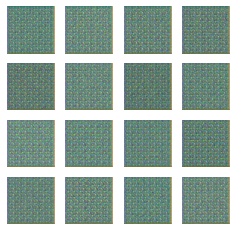

6/6 [==============================] - 8s 519ms/step - d_loss: -2.3929 - g_loss: 2.0741
Epoch 2/100
5/6 [========================>.....] - ETA: 0s - d_loss: -66.7540 - g_loss: 19.5664

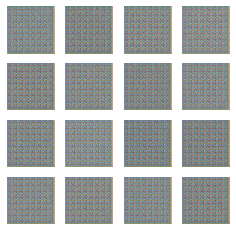

6/6 [==============================] - 2s 353ms/step - d_loss: -81.0382 - g_loss: 26.5457
Epoch 3/100
5/6 [========================>.....] - ETA: 0s - d_loss: -135.1707 - g_loss: 110.2146

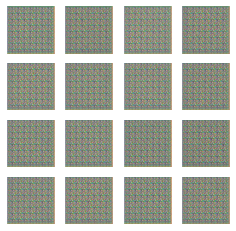

6/6 [==============================] - 2s 412ms/step - d_loss: -133.7276 - g_loss: 115.3889
Epoch 4/100
5/6 [========================>.....] - ETA: 0s - d_loss: -126.8592 - g_loss: 173.4162

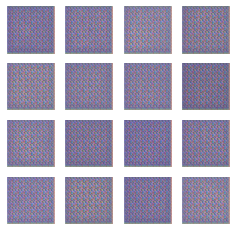

6/6 [==============================] - 2s 359ms/step - d_loss: -128.9934 - g_loss: 175.6471
Epoch 5/100
5/6 [========================>.....] - ETA: 0s - d_loss: -106.9608 - g_loss: 148.4772

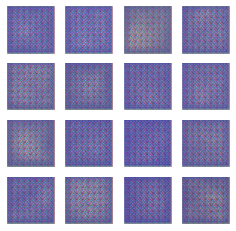

6/6 [==============================] - 2s 353ms/step - d_loss: -102.4320 - g_loss: 147.8210
Epoch 6/100
5/6 [========================>.....] - ETA: 0s - d_loss: -67.0529 - g_loss: 95.1869

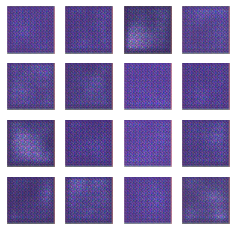

6/6 [==============================] - 2s 359ms/step - d_loss: -65.1057 - g_loss: 91.9965
Epoch 7/100
5/6 [========================>.....] - ETA: 0s - d_loss: -31.6048 - g_loss: 43.9677

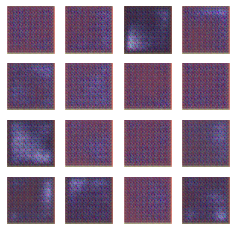

6/6 [==============================] - 2s 352ms/step - d_loss: -33.1937 - g_loss: 45.2188
Epoch 8/100
5/6 [========================>.....] - ETA: 0s - d_loss: -33.0319 - g_loss: 21.7237

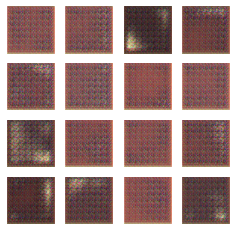

6/6 [==============================] - 2s 353ms/step - d_loss: -34.7269 - g_loss: 18.4230
Epoch 9/100
5/6 [========================>.....] - ETA: 0s - d_loss: -45.6075 - g_loss: 24.6655

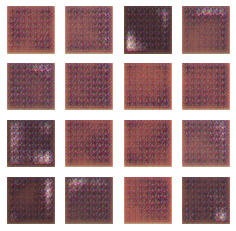

6/6 [==============================] - 2s 354ms/step - d_loss: -52.7290 - g_loss: 22.2097
Epoch 10/100
5/6 [========================>.....] - ETA: 0s - d_loss: -49.1406 - g_loss: 11.9676

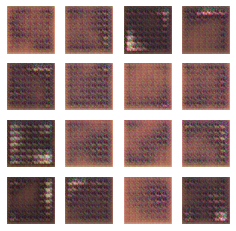

6/6 [==============================] - 2s 358ms/step - d_loss: -50.0112 - g_loss: 15.8195
Epoch 11/100
5/6 [========================>.....] - ETA: 0s - d_loss: -49.7019 - g_loss: 9.6788

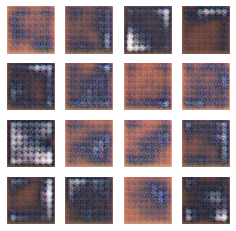

6/6 [==============================] - 2s 354ms/step - d_loss: -50.2489 - g_loss: 8.7644
Epoch 12/100
5/6 [========================>.....] - ETA: 0s - d_loss: -43.7574 - g_loss: 10.6390

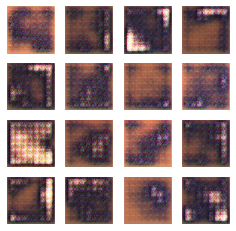

6/6 [==============================] - 3s 430ms/step - d_loss: -42.9516 - g_loss: 14.9188
Epoch 13/100
5/6 [========================>.....] - ETA: 0s - d_loss: -37.7541 - g_loss: 1.2674 

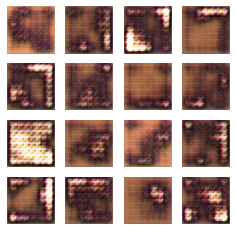

6/6 [==============================] - 2s 362ms/step - d_loss: -36.9810 - g_loss: 5.6966
Epoch 14/100
5/6 [========================>.....] - ETA: 0s - d_loss: -28.2758 - g_loss: -17.4030

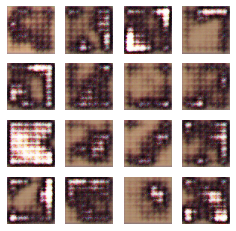

6/6 [==============================] - 2s 354ms/step - d_loss: -28.9016 - g_loss: -12.3700
Epoch 15/100
6/6 [==============================] - ETA: 0s - d_loss: -27.3865 - g_loss: -4.5636

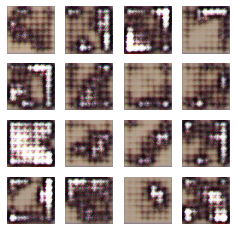

6/6 [==============================] - 2s 363ms/step - d_loss: -27.3865 - g_loss: -4.5636
Epoch 16/100
5/6 [========================>.....] - ETA: 0s - d_loss: -25.6515 - g_loss: 3.0680

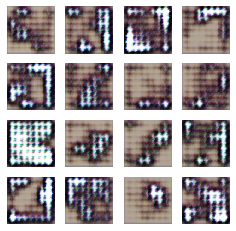

6/6 [==============================] - 2s 355ms/step - d_loss: -25.5301 - g_loss: 4.4717
Epoch 17/100
5/6 [========================>.....] - ETA: 0s - d_loss: -24.7810 - g_loss: 24.0229

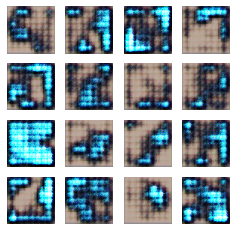

6/6 [==============================] - 2s 361ms/step - d_loss: -26.4067 - g_loss: 34.6364
Epoch 18/100
5/6 [========================>.....] - ETA: 0s - d_loss: -30.8607 - g_loss: 9.1009

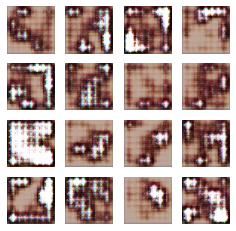

6/6 [==============================] - 2s 363ms/step - d_loss: -32.1425 - g_loss: 19.0351
Epoch 19/100
5/6 [========================>.....] - ETA: 0s - d_loss: -27.2226 - g_loss: -5.7061

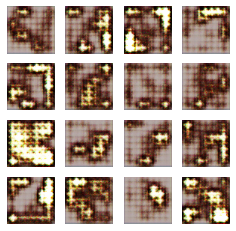

6/6 [==============================] - 2s 355ms/step - d_loss: -27.7554 - g_loss: -3.8032
Epoch 20/100
5/6 [========================>.....] - ETA: 0s - d_loss: -25.9032 - g_loss: 6.1272 

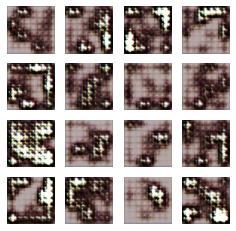

6/6 [==============================] - 2s 360ms/step - d_loss: -26.6639 - g_loss: 1.4350
Epoch 21/100
5/6 [========================>.....] - ETA: 0s - d_loss: -26.5754 - g_loss: 12.7515

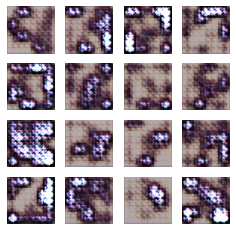

6/6 [==============================] - 2s 354ms/step - d_loss: -26.4523 - g_loss: 10.1698
Epoch 22/100
5/6 [========================>.....] - ETA: 0s - d_loss: -26.2380 - g_loss: 13.7602

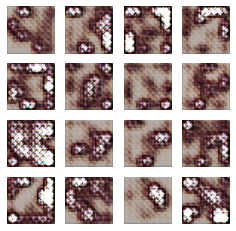

6/6 [==============================] - 3s 437ms/step - d_loss: -26.4082 - g_loss: 14.3286
Epoch 23/100
5/6 [========================>.....] - ETA: 0s - d_loss: -27.5228 - g_loss: 0.6230

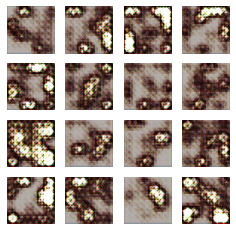

6/6 [==============================] - 2s 354ms/step - d_loss: -28.0441 - g_loss: 3.9209
Epoch 24/100
6/6 [==============================] - ETA: 0s - d_loss: -26.5925 - g_loss: 13.0612

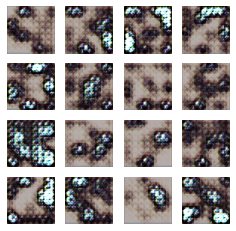

6/6 [==============================] - 2s 362ms/step - d_loss: -26.5925 - g_loss: 13.0612
Epoch 25/100
5/6 [========================>.....] - ETA: 0s - d_loss: -24.7083 - g_loss: 20.3790

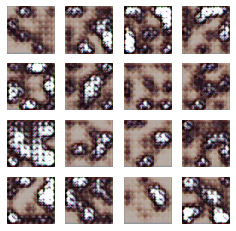

6/6 [==============================] - 2s 364ms/step - d_loss: -24.5462 - g_loss: 21.8496
Epoch 26/100
5/6 [========================>.....] - ETA: 0s - d_loss: -22.2054 - g_loss: 11.0201

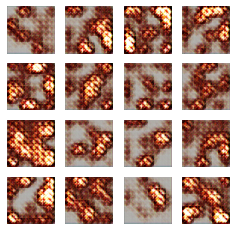

6/6 [==============================] - 2s 361ms/step - d_loss: -22.1573 - g_loss: 13.3972
Epoch 27/100
5/6 [========================>.....] - ETA: 0s - d_loss: -26.2379 - g_loss: 3.4033

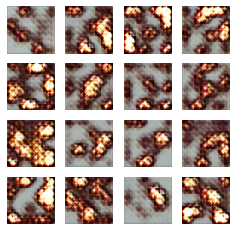

6/6 [==============================] - 2s 364ms/step - d_loss: -26.1382 - g_loss: 9.2653
Epoch 28/100
5/6 [========================>.....] - ETA: 0s - d_loss: -24.2938 - g_loss: 26.4057

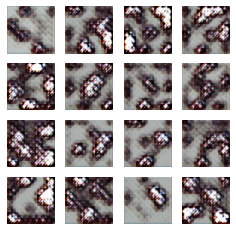

6/6 [==============================] - 2s 353ms/step - d_loss: -25.5117 - g_loss: 27.3593
Epoch 29/100
6/6 [==============================] - ETA: 0s - d_loss: -21.4119 - g_loss: 13.8835

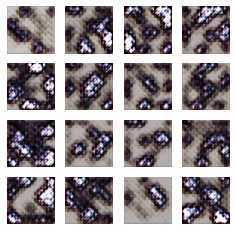

6/6 [==============================] - 2s 361ms/step - d_loss: -21.4119 - g_loss: 13.8835
Epoch 30/100
5/6 [========================>.....] - ETA: 0s - d_loss: -23.8930 - g_loss: 12.6837

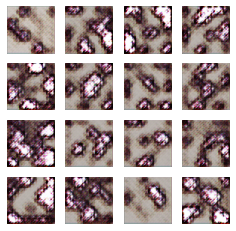

6/6 [==============================] - 2s 354ms/step - d_loss: -25.5402 - g_loss: 20.9171
Epoch 31/100
6/6 [==============================] - ETA: 0s - d_loss: -25.6618 - g_loss: 13.0350

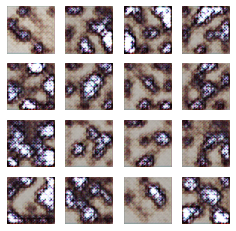

6/6 [==============================] - 3s 451ms/step - d_loss: -25.6618 - g_loss: 13.0350
Epoch 32/100
6/6 [==============================] - ETA: 0s - d_loss: -24.9176 - g_loss: 15.1402

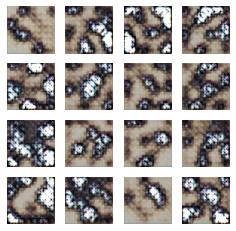

6/6 [==============================] - 2s 363ms/step - d_loss: -24.9176 - g_loss: 15.1402
Epoch 33/100
5/6 [========================>.....] - ETA: 0s - d_loss: -22.9851 - g_loss: 23.6794

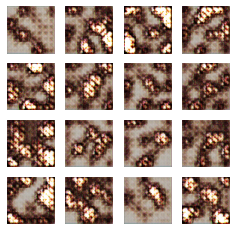

6/6 [==============================] - 2s 362ms/step - d_loss: -24.1332 - g_loss: 22.7526
Epoch 34/100
5/6 [========================>.....] - ETA: 0s - d_loss: -20.4661 - g_loss: 7.0788

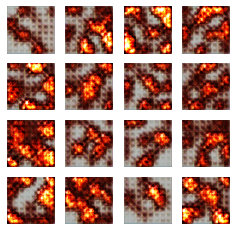

6/6 [==============================] - 2s 358ms/step - d_loss: -21.8614 - g_loss: 2.9759
Epoch 35/100
5/6 [========================>.....] - ETA: 0s - d_loss: -22.3186 - g_loss: 30.4761

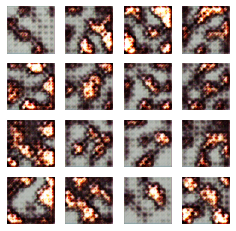

6/6 [==============================] - 2s 360ms/step - d_loss: -23.8640 - g_loss: 26.8033
Epoch 36/100
5/6 [========================>.....] - ETA: 0s - d_loss: -22.2430 - g_loss: 40.2662

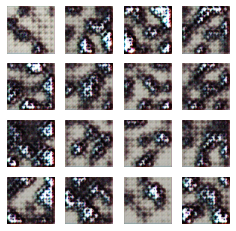

6/6 [==============================] - 2s 355ms/step - d_loss: -23.4602 - g_loss: 35.8927
Epoch 37/100
5/6 [========================>.....] - ETA: 0s - d_loss: -24.1526 - g_loss: 19.1708

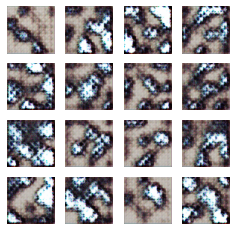

6/6 [==============================] - 2s 361ms/step - d_loss: -27.1728 - g_loss: 26.1605
Epoch 38/100
5/6 [========================>.....] - ETA: 0s - d_loss: -24.2623 - g_loss: 13.8242

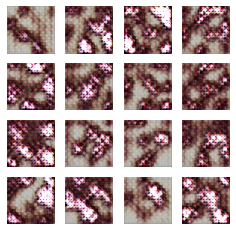

6/6 [==============================] - 2s 365ms/step - d_loss: -24.7476 - g_loss: 18.2467
Epoch 39/100
5/6 [========================>.....] - ETA: 0s - d_loss: -23.3969 - g_loss: -0.6869

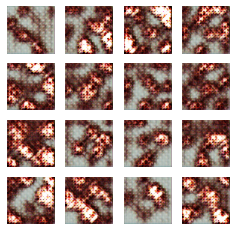

6/6 [==============================] - 2s 365ms/step - d_loss: -24.6040 - g_loss: 6.2800
Epoch 40/100
5/6 [========================>.....] - ETA: 0s - d_loss: -23.8034 - g_loss: 15.9299

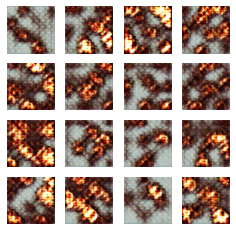

6/6 [==============================] - 3s 442ms/step - d_loss: -25.0969 - g_loss: 13.3250
Epoch 41/100
5/6 [========================>.....] - ETA: 0s - d_loss: -25.1449 - g_loss: 28.0686

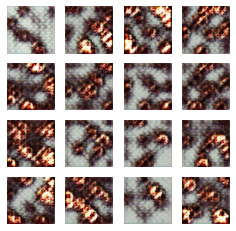

6/6 [==============================] - 2s 364ms/step - d_loss: -26.4553 - g_loss: 30.3752
Epoch 42/100
5/6 [========================>.....] - ETA: 0s - d_loss: -25.7805 - g_loss: 25.1638

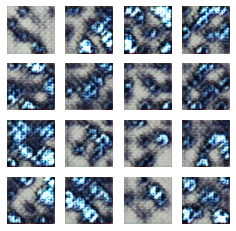

6/6 [==============================] - 2s 364ms/step - d_loss: -27.1822 - g_loss: 31.0857
Epoch 43/100
5/6 [========================>.....] - ETA: 0s - d_loss: -20.9130 - g_loss: 50.4647

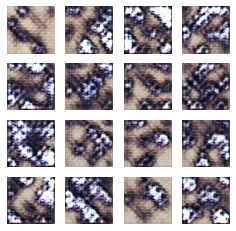

6/6 [==============================] - 2s 365ms/step - d_loss: -26.5224 - g_loss: 54.4803
Epoch 44/100
5/6 [========================>.....] - ETA: 0s - d_loss: -23.2874 - g_loss: 3.5940 

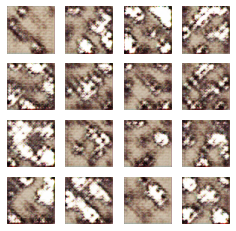

6/6 [==============================] - 2s 363ms/step - d_loss: -24.2403 - g_loss: 11.5103
Epoch 45/100
5/6 [========================>.....] - ETA: 0s - d_loss: -24.2757 - g_loss: 54.7675

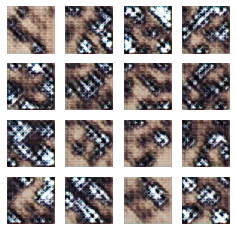

6/6 [==============================] - 2s 365ms/step - d_loss: -24.7823 - g_loss: 54.9790
Epoch 46/100
5/6 [========================>.....] - ETA: 0s - d_loss: -23.1422 - g_loss: 33.8115

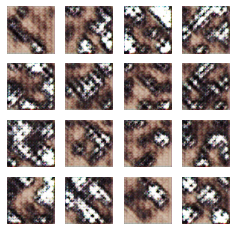

6/6 [==============================] - 2s 364ms/step - d_loss: -30.6269 - g_loss: 22.7195
Epoch 47/100
5/6 [========================>.....] - ETA: 0s - d_loss: -26.3832 - g_loss: 65.9782

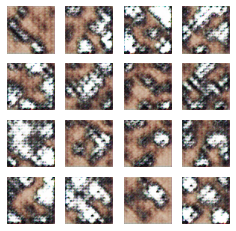

6/6 [==============================] - 2s 364ms/step - d_loss: -27.7007 - g_loss: 55.3010
Epoch 48/100
5/6 [========================>.....] - ETA: 0s - d_loss: -20.9621 - g_loss: 7.2475

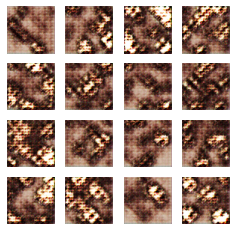

6/6 [==============================] - 2s 365ms/step - d_loss: -21.1440 - g_loss: 11.9895
Epoch 49/100
5/6 [========================>.....] - ETA: 0s - d_loss: -22.0538 - g_loss: 30.7937

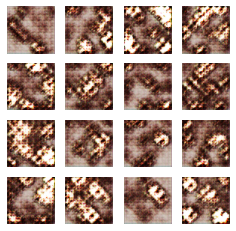

6/6 [==============================] - 2s 364ms/step - d_loss: -22.8700 - g_loss: 34.4599
Epoch 50/100
5/6 [========================>.....] - ETA: 0s - d_loss: -23.0563 - g_loss: 18.4109

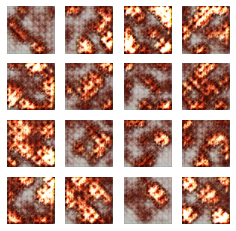

6/6 [==============================] - 3s 442ms/step - d_loss: -23.1582 - g_loss: 23.3096
Epoch 51/100
6/6 [==============================] - ETA: 0s - d_loss: -26.3012 - g_loss: 28.5015

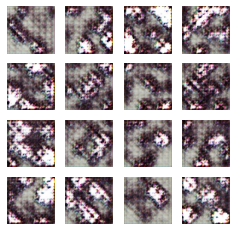

6/6 [==============================] - 2s 363ms/step - d_loss: -26.3012 - g_loss: 28.5015
Epoch 52/100
5/6 [========================>.....] - ETA: 0s - d_loss: -19.3363 - g_loss: 60.3489

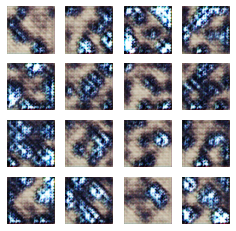

6/6 [==============================] - 2s 364ms/step - d_loss: -19.5858 - g_loss: 54.2336
Epoch 53/100
5/6 [========================>.....] - ETA: 0s - d_loss: -24.0366 - g_loss: 34.7631

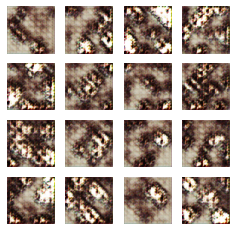

6/6 [==============================] - 2s 364ms/step - d_loss: -25.8522 - g_loss: 37.4031
Epoch 54/100
5/6 [========================>.....] - ETA: 0s - d_loss: -21.5795 - g_loss: 19.9119

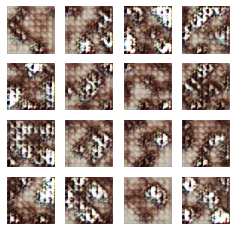

6/6 [==============================] - 2s 364ms/step - d_loss: -22.3377 - g_loss: 16.4828
Epoch 55/100
5/6 [========================>.....] - ETA: 0s - d_loss: -20.2925 - g_loss: 23.5714

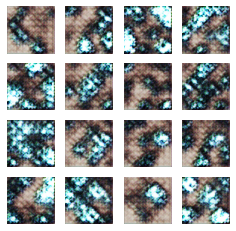

6/6 [==============================] - 2s 365ms/step - d_loss: -22.5465 - g_loss: 22.3777
Epoch 56/100
6/6 [==============================] - ETA: 0s - d_loss: -21.0034 - g_loss: 54.1806

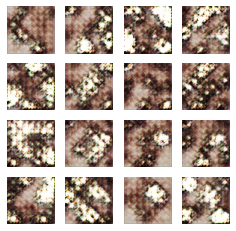

6/6 [==============================] - 2s 372ms/step - d_loss: -21.0034 - g_loss: 54.1806
Epoch 57/100
5/6 [========================>.....] - ETA: 0s - d_loss: -20.2165 - g_loss: 28.4458

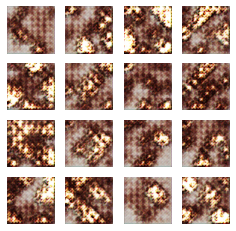

6/6 [==============================] - 2s 362ms/step - d_loss: -20.5415 - g_loss: 24.9912
Epoch 58/100
5/6 [========================>.....] - ETA: 0s - d_loss: -23.7302 - g_loss: 29.1452

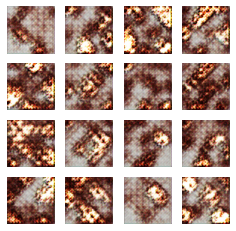

6/6 [==============================] - 2s 363ms/step - d_loss: -24.1450 - g_loss: 26.3988
Epoch 59/100
5/6 [========================>.....] - ETA: 0s - d_loss: -23.5805 - g_loss: 43.5415

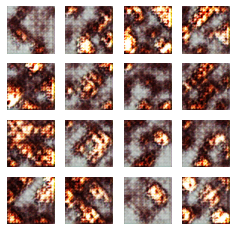

6/6 [==============================] - 3s 440ms/step - d_loss: -24.0554 - g_loss: 44.6886
Epoch 60/100
5/6 [========================>.....] - ETA: 0s - d_loss: -22.7281 - g_loss: 48.8246

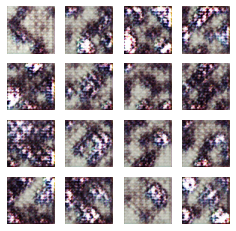

6/6 [==============================] - 2s 364ms/step - d_loss: -24.5519 - g_loss: 51.5010
Epoch 61/100
6/6 [==============================] - ETA: 0s - d_loss: -24.0814 - g_loss: 22.0563

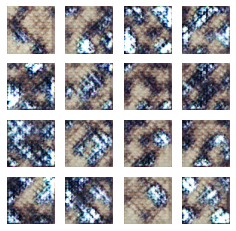

6/6 [==============================] - 2s 364ms/step - d_loss: -24.0814 - g_loss: 22.0563
Epoch 62/100
5/6 [========================>.....] - ETA: 0s - d_loss: -18.9368 - g_loss: 50.3405

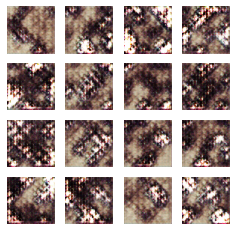

6/6 [==============================] - 2s 364ms/step - d_loss: -20.2177 - g_loss: 50.1970
Epoch 63/100
5/6 [========================>.....] - ETA: 0s - d_loss: -19.0727 - g_loss: 25.0949

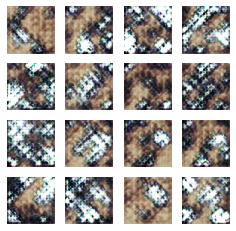

6/6 [==============================] - 2s 362ms/step - d_loss: -20.0413 - g_loss: 28.3044
Epoch 64/100
5/6 [========================>.....] - ETA: 0s - d_loss: -20.9378 - g_loss: 29.7092

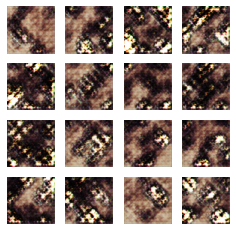

6/6 [==============================] - 2s 365ms/step - d_loss: -22.3851 - g_loss: 35.0336
Epoch 65/100
6/6 [==============================] - ETA: 0s - d_loss: -22.4892 - g_loss: 30.7872

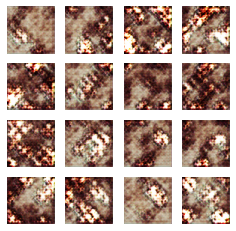

6/6 [==============================] - 2s 364ms/step - d_loss: -22.4892 - g_loss: 30.7872
Epoch 66/100
5/6 [========================>.....] - ETA: 0s - d_loss: -19.5131 - g_loss: 19.4188

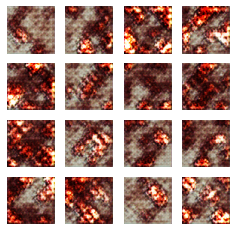

6/6 [==============================] - 2s 362ms/step - d_loss: -21.0032 - g_loss: 13.6433
Epoch 67/100
5/6 [========================>.....] - ETA: 0s - d_loss: -20.2838 - g_loss: 47.3281

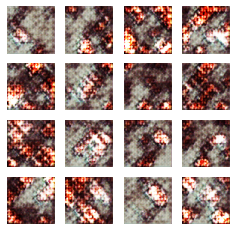

6/6 [==============================] - 2s 365ms/step - d_loss: -21.7618 - g_loss: 49.1826
Epoch 68/100
5/6 [========================>.....] - ETA: 0s - d_loss: -19.3622 - g_loss: 55.4169

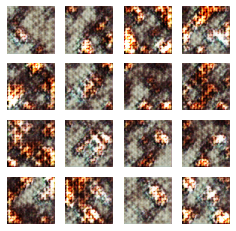

6/6 [==============================] - 3s 440ms/step - d_loss: -21.1174 - g_loss: 56.6046
Epoch 69/100
5/6 [========================>.....] - ETA: 0s - d_loss: -17.2252 - g_loss: 46.2340

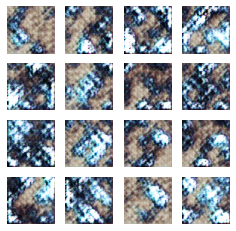

6/6 [==============================] - 2s 365ms/step - d_loss: -17.9625 - g_loss: 43.8683
Epoch 70/100
5/6 [========================>.....] - ETA: 0s - d_loss: -17.0287 - g_loss: 40.0965

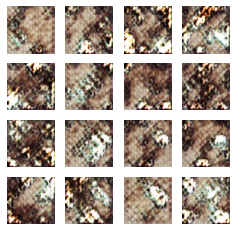

6/6 [==============================] - 2s 362ms/step - d_loss: -18.0811 - g_loss: 42.0744
Epoch 71/100
5/6 [========================>.....] - ETA: 0s - d_loss: -16.8365 - g_loss: 35.7655

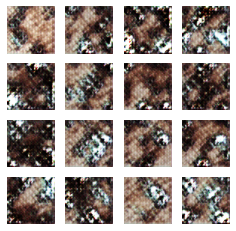

6/6 [==============================] - 2s 356ms/step - d_loss: -19.6791 - g_loss: 27.5450
Epoch 72/100
5/6 [========================>.....] - ETA: 0s - d_loss: -17.4666 - g_loss: 34.2367

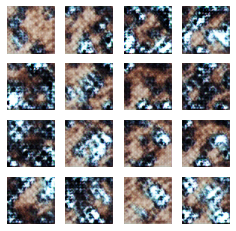

6/6 [==============================] - 2s 362ms/step - d_loss: -19.9084 - g_loss: 34.9064
Epoch 73/100
5/6 [========================>.....] - ETA: 0s - d_loss: -18.1802 - g_loss: 29.6859

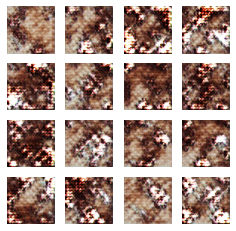

6/6 [==============================] - 2s 362ms/step - d_loss: -18.4780 - g_loss: 26.8999
Epoch 74/100
5/6 [========================>.....] - ETA: 0s - d_loss: -18.7866 - g_loss: 24.5212

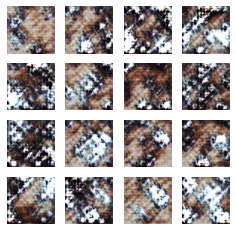

6/6 [==============================] - 2s 364ms/step - d_loss: -19.1329 - g_loss: 23.4936
Epoch 75/100
5/6 [========================>.....] - ETA: 0s - d_loss: -18.3795 - g_loss: 38.8200

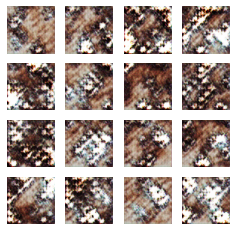

6/6 [==============================] - 2s 366ms/step - d_loss: -19.7228 - g_loss: 29.1797
Epoch 76/100
5/6 [========================>.....] - ETA: 0s - d_loss: -19.2490 - g_loss: 26.8870

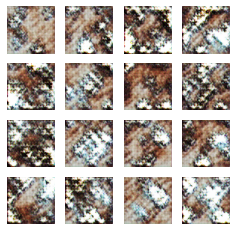

6/6 [==============================] - 2s 364ms/step - d_loss: -19.8555 - g_loss: 29.6732
Epoch 77/100
6/6 [==============================] - ETA: 0s - d_loss: -20.4906 - g_loss: 40.6615

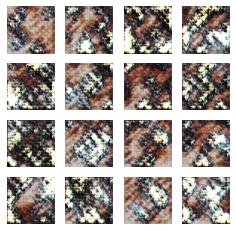

6/6 [==============================] - 2s 364ms/step - d_loss: -20.4906 - g_loss: 40.6615
Epoch 78/100
5/6 [========================>.....] - ETA: 0s - d_loss: -19.3283 - g_loss: 12.0681

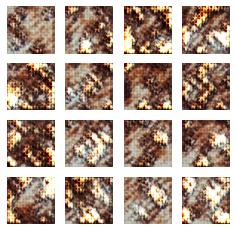

6/6 [==============================] - 3s 431ms/step - d_loss: -18.8074 - g_loss: 15.0651
Epoch 79/100
5/6 [========================>.....] - ETA: 0s - d_loss: -18.8882 - g_loss: 33.8230

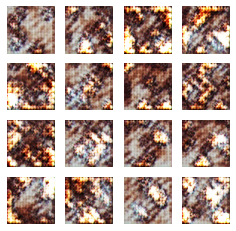

6/6 [==============================] - 2s 360ms/step - d_loss: -18.9744 - g_loss: 33.5698
Epoch 80/100
5/6 [========================>.....] - ETA: 0s - d_loss: -18.4677 - g_loss: 27.9582

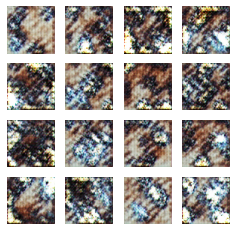

6/6 [==============================] - 2s 364ms/step - d_loss: -19.6210 - g_loss: 27.2566
Epoch 81/100
5/6 [========================>.....] - ETA: 0s - d_loss: -17.7934 - g_loss: 41.1077

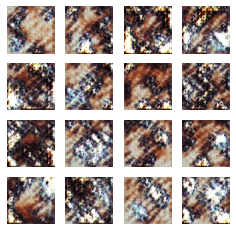

6/6 [==============================] - 2s 363ms/step - d_loss: -18.9294 - g_loss: 42.2185
Epoch 82/100
6/6 [==============================] - ETA: 0s - d_loss: -18.9351 - g_loss: 18.9973

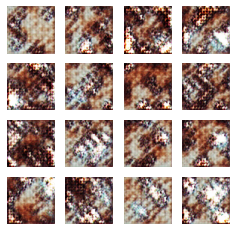

6/6 [==============================] - 2s 363ms/step - d_loss: -18.9351 - g_loss: 18.9973
Epoch 83/100
5/6 [========================>.....] - ETA: 0s - d_loss: -19.1136 - g_loss: 23.0301

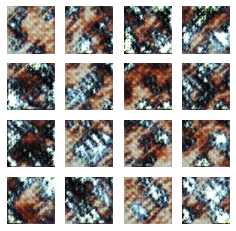

6/6 [==============================] - 2s 363ms/step - d_loss: -18.7022 - g_loss: 22.4888
Epoch 84/100
6/6 [==============================] - ETA: 0s - d_loss: -17.1161 - g_loss: 13.2740

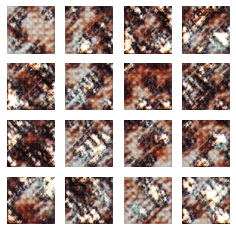

6/6 [==============================] - 2s 363ms/step - d_loss: -17.1161 - g_loss: 13.2740
Epoch 85/100
6/6 [==============================] - ETA: 0s - d_loss: -18.1457 - g_loss: 9.7400

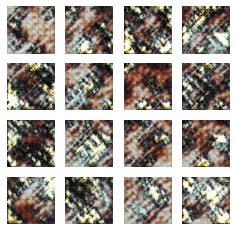

6/6 [==============================] - 2s 365ms/step - d_loss: -18.1457 - g_loss: 9.7400
Epoch 86/100
5/6 [========================>.....] - ETA: 0s - d_loss: -16.8023 - g_loss: 10.2221

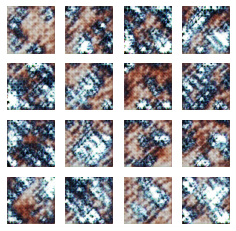

6/6 [==============================] - 2s 363ms/step - d_loss: -18.0100 - g_loss: 11.0428
Epoch 87/100
5/6 [========================>.....] - ETA: 0s - d_loss: -16.1381 - g_loss: 10.8721

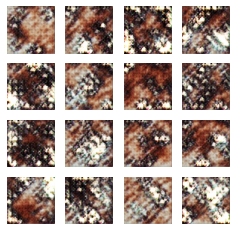

6/6 [==============================] - 3s 441ms/step - d_loss: -17.3104 - g_loss: 21.7932
Epoch 88/100
5/6 [========================>.....] - ETA: 0s - d_loss: -17.1761 - g_loss: 26.5983

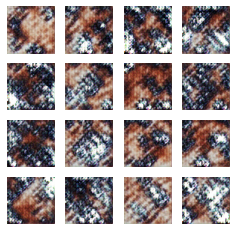

6/6 [==============================] - 2s 363ms/step - d_loss: -18.2309 - g_loss: 26.1258
Epoch 89/100
5/6 [========================>.....] - ETA: 0s - d_loss: -17.8127 - g_loss: 2.3219 

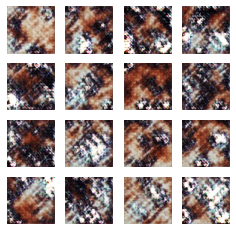

6/6 [==============================] - 2s 363ms/step - d_loss: -19.1560 - g_loss: 6.2197
Epoch 90/100
5/6 [========================>.....] - ETA: 0s - d_loss: -16.8468 - g_loss: 16.5941

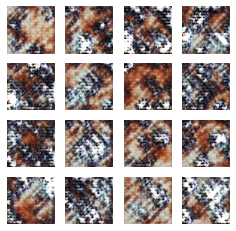

6/6 [==============================] - 2s 363ms/step - d_loss: -17.3943 - g_loss: 14.3263
Epoch 91/100
5/6 [========================>.....] - ETA: 0s - d_loss: -17.9530 - g_loss: 7.2985

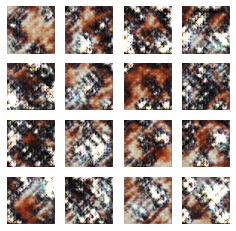

6/6 [==============================] - 2s 364ms/step - d_loss: -19.2653 - g_loss: 13.1425
Epoch 92/100
5/6 [========================>.....] - ETA: 0s - d_loss: -18.3837 - g_loss: 22.2350

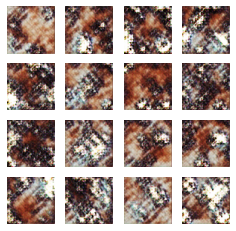

6/6 [==============================] - 2s 364ms/step - d_loss: -20.2665 - g_loss: 18.0177
Epoch 93/100
6/6 [==============================] - ETA: 0s - d_loss: -20.9741 - g_loss: 40.5447

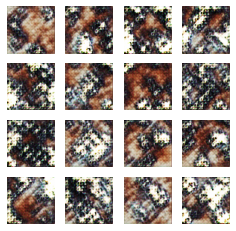

6/6 [==============================] - 2s 364ms/step - d_loss: -20.9741 - g_loss: 40.5447
Epoch 94/100
5/6 [========================>.....] - ETA: 0s - d_loss: -18.3243 - g_loss: 18.2853

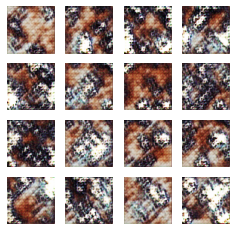

6/6 [==============================] - 2s 364ms/step - d_loss: -17.1712 - g_loss: 25.2252
Epoch 95/100
5/6 [========================>.....] - ETA: 0s - d_loss: -16.4208 - g_loss: 8.0119

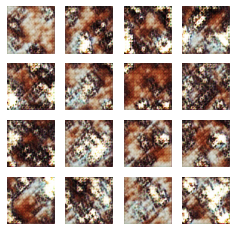

6/6 [==============================] - 2s 363ms/step - d_loss: -16.6450 - g_loss: 10.1726
Epoch 96/100
5/6 [========================>.....] - ETA: 0s - d_loss: -16.9353 - g_loss: 40.0675

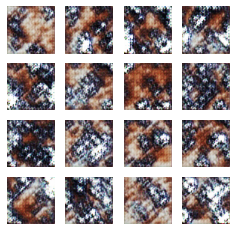

6/6 [==============================] - 3s 431ms/step - d_loss: -17.7012 - g_loss: 35.2028
Epoch 97/100
5/6 [========================>.....] - ETA: 0s - d_loss: -17.4047 - g_loss: 0.1103 

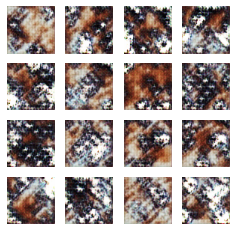

6/6 [==============================] - 2s 362ms/step - d_loss: -19.5970 - g_loss: 0.6425
Epoch 98/100
5/6 [========================>.....] - ETA: 0s - d_loss: -15.7842 - g_loss: 0.6909 

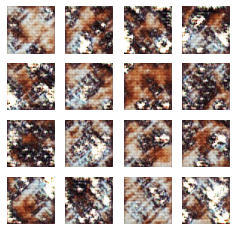

6/6 [==============================] - 2s 363ms/step - d_loss: -15.4367 - g_loss: 3.9963
Epoch 99/100
5/6 [========================>.....] - ETA: 0s - d_loss: -16.5834 - g_loss: 12.9670

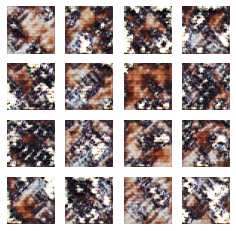

6/6 [==============================] - 2s 363ms/step - d_loss: -18.6077 - g_loss: 5.5440
Epoch 100/100
5/6 [========================>.....] - ETA: 0s - d_loss: -19.1788 - g_loss: 16.2945

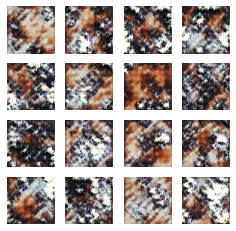

6/6 [==============================] - 2s 363ms/step - d_loss: -18.9696 - g_loss: 17.1598


In [ ]:
NUM_EPOCHS = 100 # number of epochs
wgan_gp.fit(train_images, epochs=NUM_EPOCHS, callbacks=[GANMonitor(num_img=16, latent_dim=LATENT_DIM)])